# Data Review for _Illusory Tempo - Motor_ and _Illusory Tempo - Motor Split Range_

In [9]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
import scipy.stats as stats

THEME = 'light'

if THEME == 'dark':
    background_color = '#151619'
    text_color = 'w'
    bar_alpha = 1
    color1 = '#90E6E2'
    color2 = '#FAB2B9'
else:
    background_color = 'w'
    text_color = 'k'
    bar_alpha = .75
    color1 = '#002C6A'
    color2 = '#E45171'

plt.rcParams.update({
    # BACKGROUND
    'figure.facecolor': background_color,
    'axes.facecolor': background_color,
    'savefig.facecolor': background_color,

    # TEXT
    'text.color': text_color,
    'axes.labelcolor': text_color,
    'xtick.color': text_color,
    'ytick.color': text_color,
    'figure.titlesize': 32,  # fontsize of the figure title
    'axes.labelsize': 28,  # fontsize of the x and y labels
    'xtick.labelsize': 23,  # fontsize of the tick labels
    'ytick.labelsize': 23,  # fontsize of the tick labels
    'legend.fontsize': 16,  # legend fontsize
    'legend.title_fontsize': 18,  # legend title size

    # FIGURE STYLE
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.spines.left': True,
    'axes.spines.bottom': True,
    'axes.edgecolor': text_color,
    'axes.grid': False,
    'ytick.left': True,
    'xtick.bottom': True
})

## Load processed data

In [12]:
DATAFILE = '../processed_data/processed_taps.csv'
data = pd.read_csv(DATAFILE, low_memory=False)
data.subject = data.subject.astype(str)
data.ioi = data.ioi.astype(int).astype(str)
data.usable = data.usable.astype(bool)

## Synchronization stabilizes around the third interval

Text(0, 0.5, 'Circ. Mean Phase')

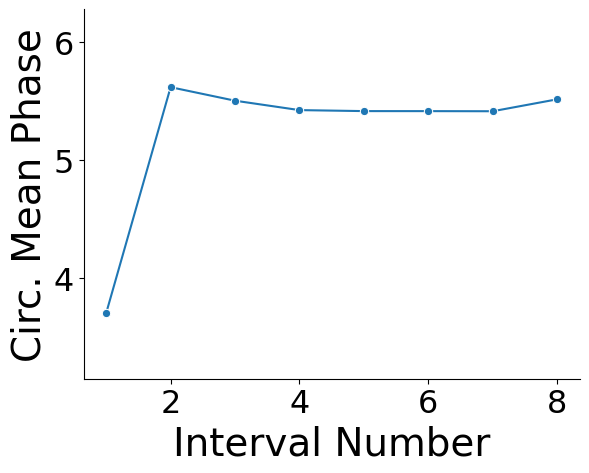

In [15]:
m = []
for n in range(1, 9):
    m.append(stats.circmean(data.tap_phase[data.interval_number == n]))

sns.lineplot(x=range(1, 9), y=m, marker='o')
plt.ylim(np.pi, 2*np.pi)
plt.xlabel('Interval Number')
plt.ylabel('Circ. Mean Phase')

## Split synchronization and continuation into separate tables

In [18]:
sdata = data[(data.interval_number >= 3) & (data.interval_number <= 8)].copy()  # Analyze all sync taps after the 3rd tone
cdata = data[(data.interval_number >= 9) & (data.interval_number <= 23)].copy()  # Analyze all continuation taps after the 9th tone (1st continuation tone)

### Synchronization tap phase distribution shows Arduino blindspot issue, with outlier at phase 0.

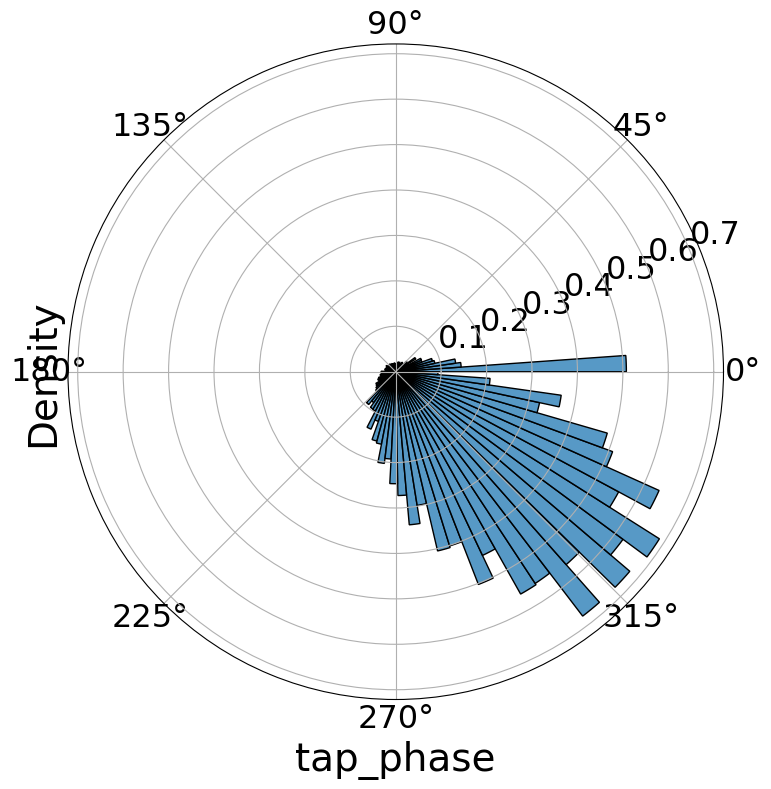

In [21]:
plt.subplot(111, projection='polar')
sns.histplot(data=sdata, x='tap_phase', bins=np.linspace(0, 2*np.pi, 90), stat='density')
plt.gcf().set_size_inches(8, 8)
plt.tight_layout()

### Excluding 0-phase taps gives a relatively normal distribution.

In [24]:
sdata = sdata[sdata.usable]

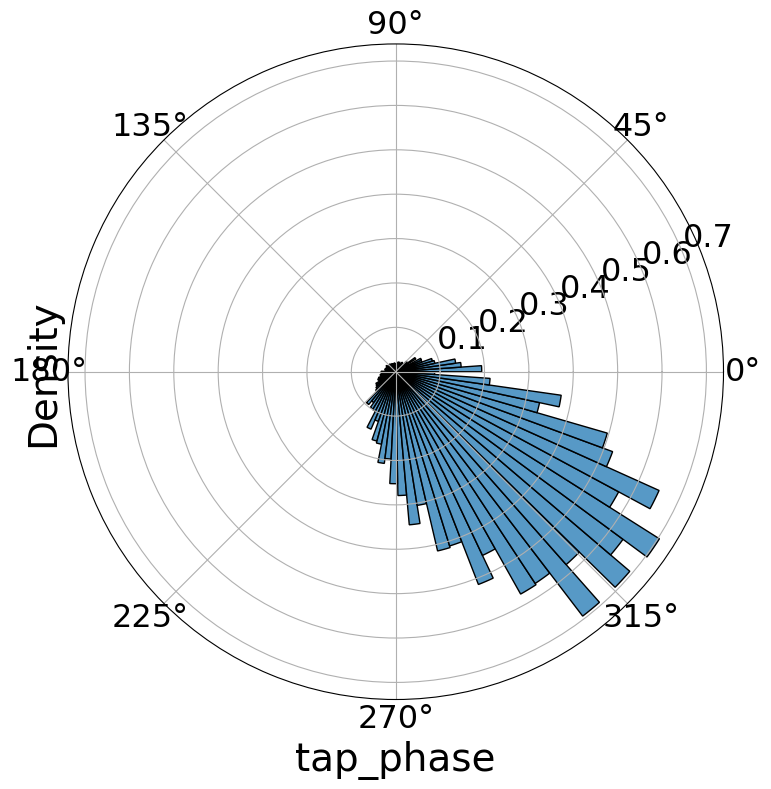

In [26]:
plt.subplot(111, projection='polar')
sns.histplot(data=sdata, x='tap_phase', bins=np.linspace(0, 2*np.pi, 90), stat='density')
plt.gcf().set_size_inches(8, 8)
plt.tight_layout()

### Continuation tapping ITIs

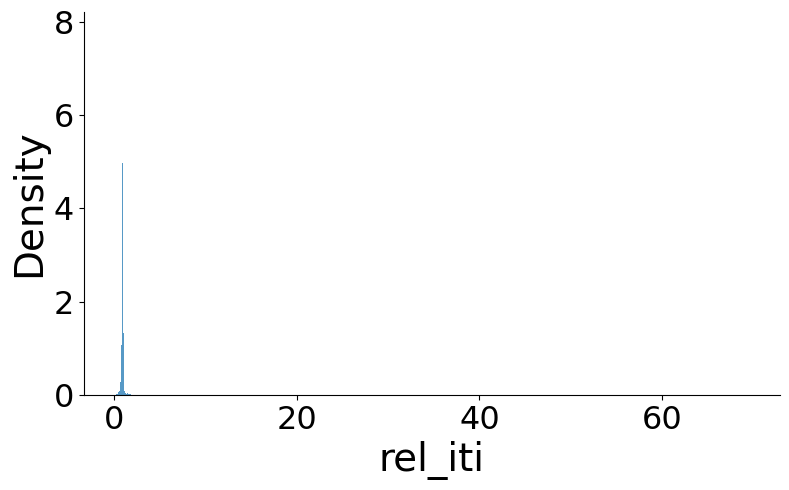

In [29]:
sns.histplot(data=cdata, x='rel_iti', stat='density')
plt.gcf().set_size_inches(8, 5)
plt.tight_layout()

### After excluding extreme relative ITIs

In [31]:
cdata = cdata[cdata.usable]

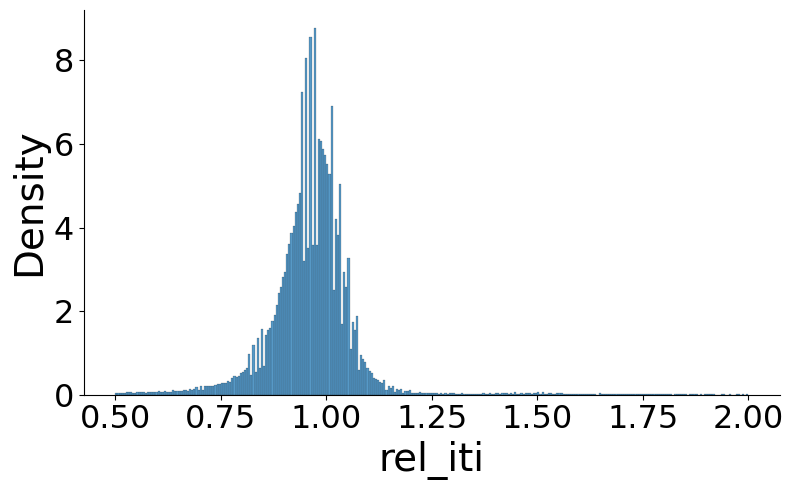

In [32]:
sns.histplot(data=cdata, x='rel_iti', binwidth=.005, stat='density')
plt.gcf().set_size_inches(8, 5)
plt.tight_layout()

### By IOI

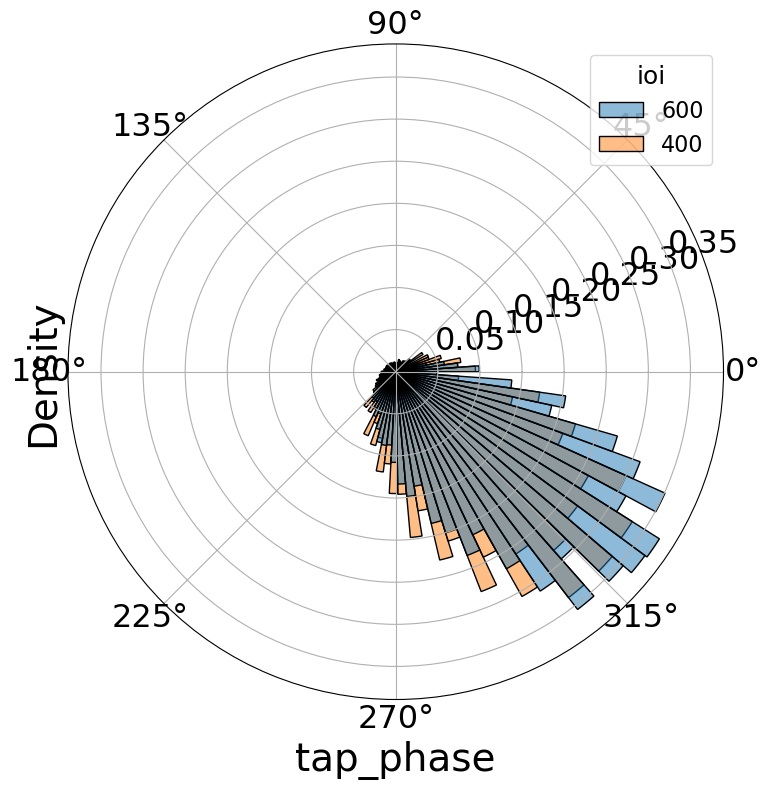

In [33]:
plt.subplot(111, projection='polar')
sns.histplot(data=sdata, x='tap_phase', hue='ioi', bins=np.linspace(0, 2*np.pi, 90), stat='density')
plt.gcf().set_size_inches(8, 8)
plt.tight_layout()

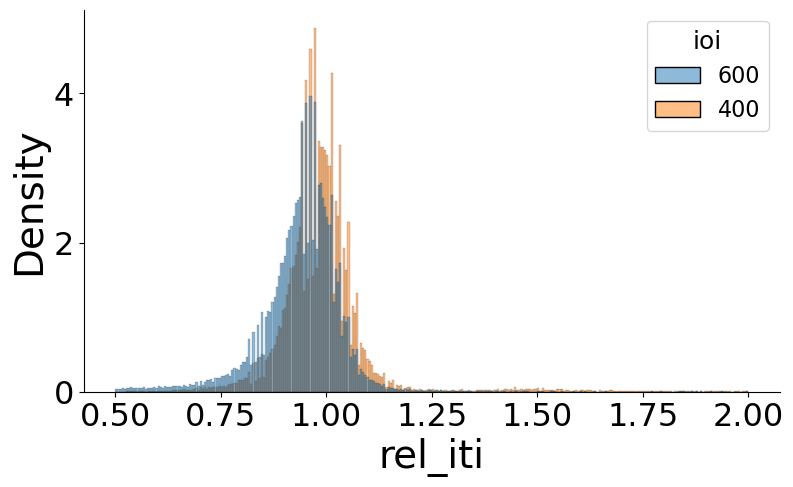

In [36]:
sns.histplot(data=cdata, x='rel_iti', hue='ioi', binwidth=.005, stat='density')
plt.gcf().set_size_inches(8, 5)
plt.tight_layout()

### By Participant

In [41]:
mp = np.empty_like(sdata.subject.unique(), dtype='float')
mrl = np.empty_like(sdata.subject.unique(), dtype='float')
fast_itis = np.empty_like(sdata.subject.unique(), dtype='float')
slow_itis = np.empty_like(sdata.subject.unique(), dtype='float')
for i, subj in enumerate(sdata.subject.unique()):
    subj_sdata = sdata[sdata.subject == subj]
    xy_coords = np.empty((len(subj_sdata), 2))
    xy_coords[:, 0] = np.cos(subj_sdata.tap_phase)
    xy_coords[:, 1] = np.sin(subj_sdata.tap_phase)
    mrl[i] = stats.directional_stats(xy_coords).mean_resultant_length
    mp[i] = stats.circmean(subj_sdata.tap_phase)

    subj_cdata = cdata[cdata.subject == subj]
    fast_itis[i] = subj_cdata[subj_cdata.ioi=='400'].iti.mean()
    slow_itis[i] = subj_cdata[subj_cdata.ioi=='600'].iti.mean()

### Eight participants (S9, S14, S32, S52, S53, S92, S98, S99) have a low mean resultant vector length of < .45

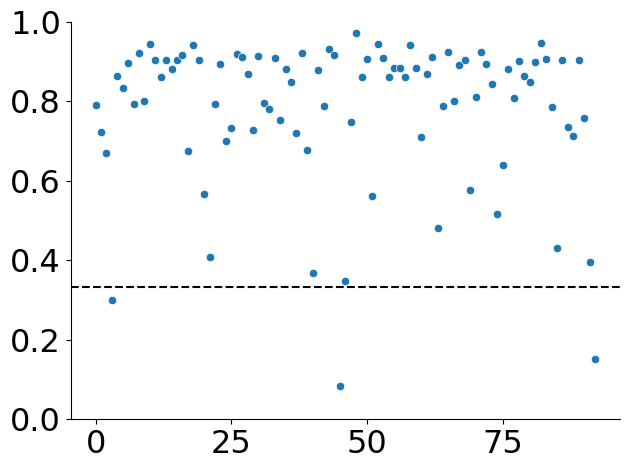

In [67]:
sns.scatterplot(x=range(len(mrl)), y=mrl)
plt.axhline(1/3, c='k', ls='--')
plt.ylim(0, 1)
plt.tight_layout()

In [69]:
sdata.subject.unique()[mrl < 1/3]

array(['14', '52', '99'], dtype=object)

### One participant (S9) has an outlier mean phase less than $\pi$

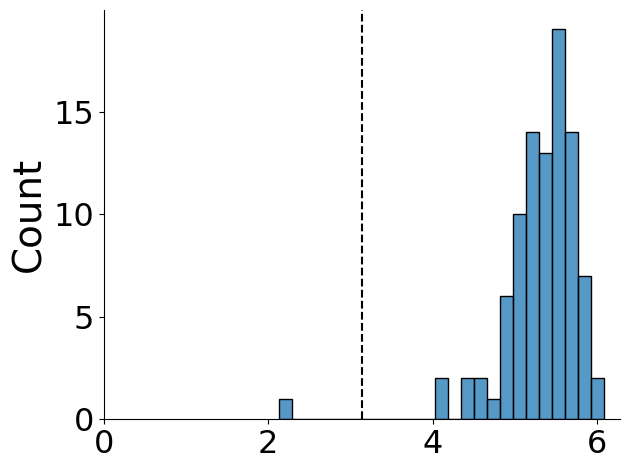

In [16]:
sns.histplot(mp, bins=25)
plt.axvline(np.pi, c='k', ls='--')
plt.xlim(0, 2*np.pi)
plt.tight_layout()

In [17]:
sdata.subject.unique()[mp < np.pi]

array(['9'], dtype=object)

## Two people (S52, S99) tapped slower than a relative ITI of 4/3
## Three people (S14, S53, S95) tapped faster than a relative ITI of 3/4

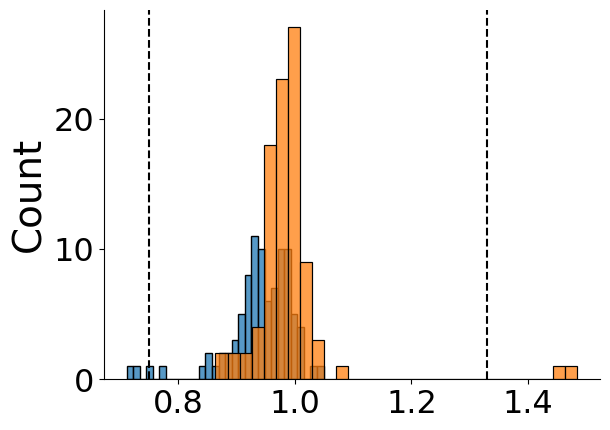

In [58]:
sns.histplot(slow_itis / 600, bins=30, color='C0', label='600 ms')
sns.histplot(fast_itis / 400, bins=30, color='C1', label='400 ms')
plt.axvline(3/4, c='k', ls='--')
plt.axvline(4/3, c='k', ls='--')

In [60]:
cdata.subject.unique()[fast_itis > 400 * 4/3],  cdata.subject.unique()[slow_itis < 600 * 3/4]

(array(['52', '99'], dtype=object), array(['14', '53', '95'], dtype=object))

## Plot tapping distributions for each participant

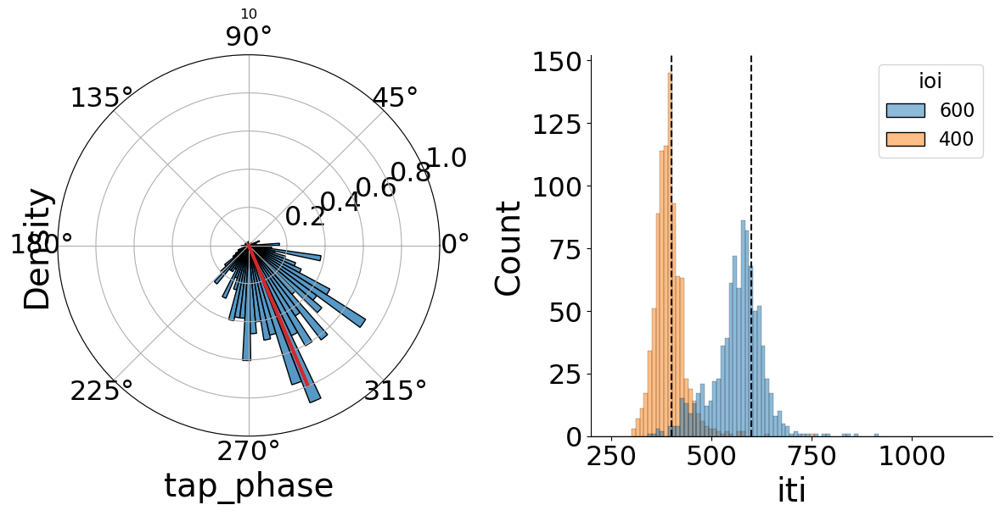

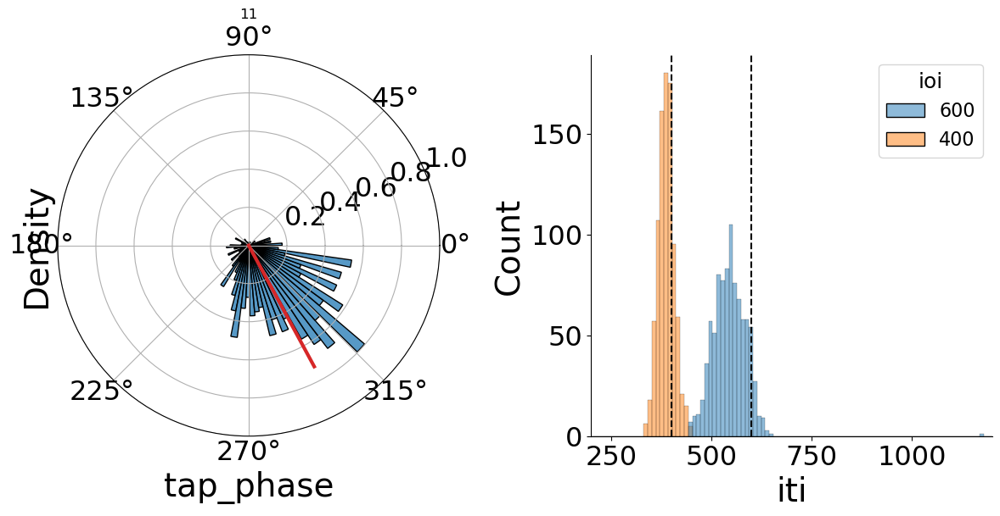

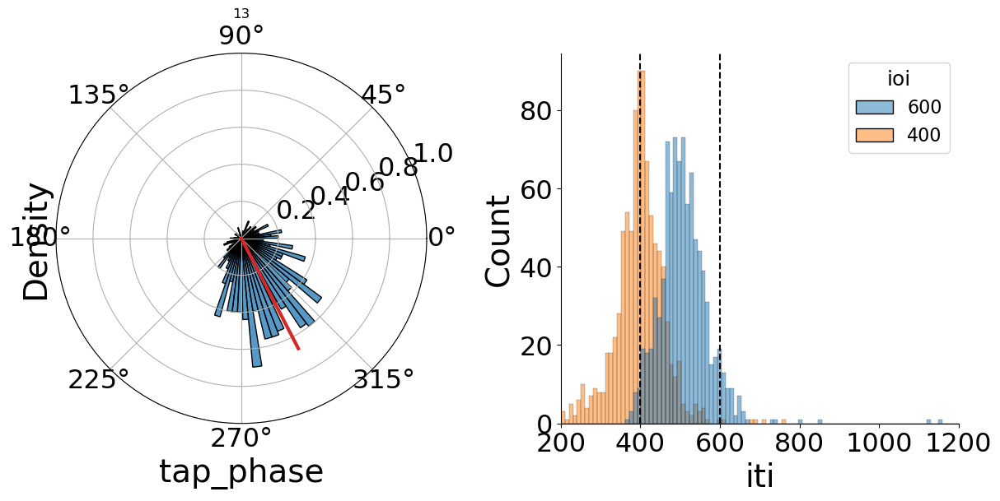

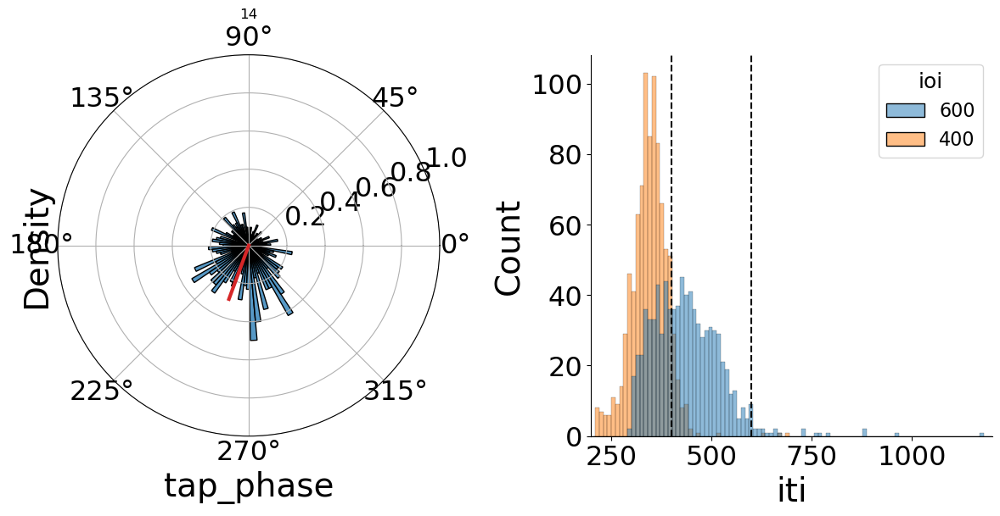

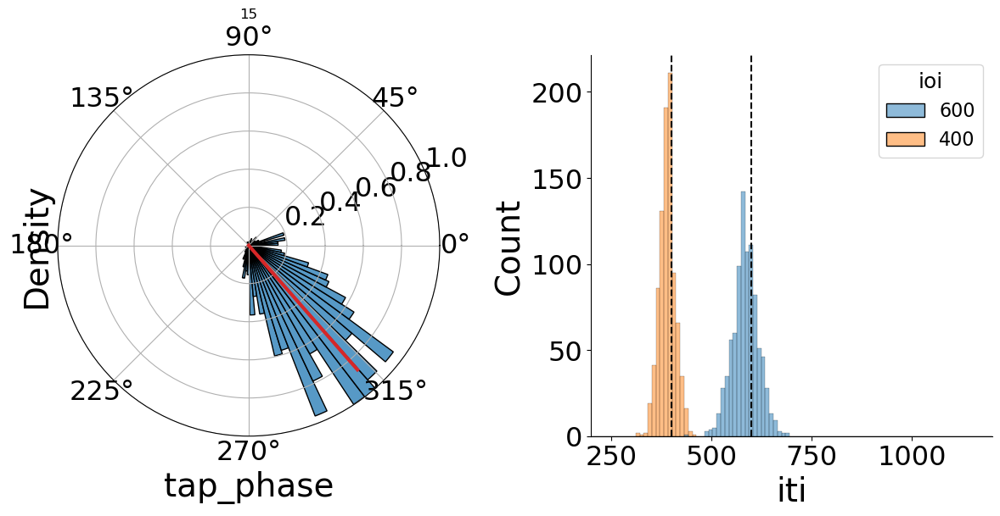

...

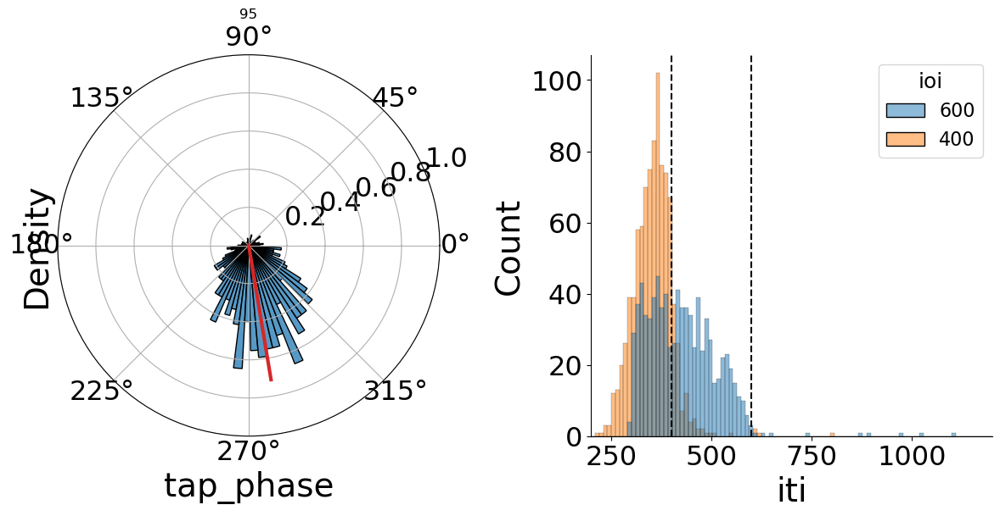

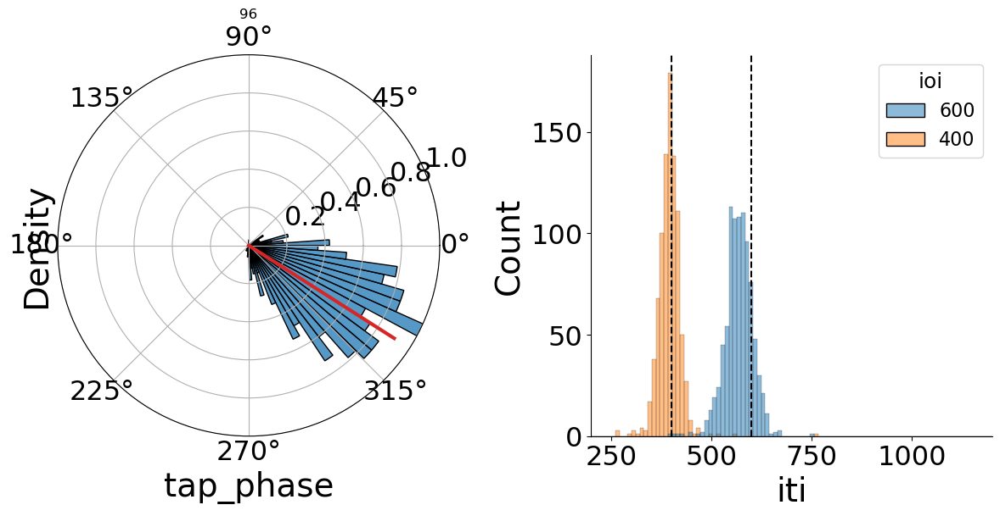

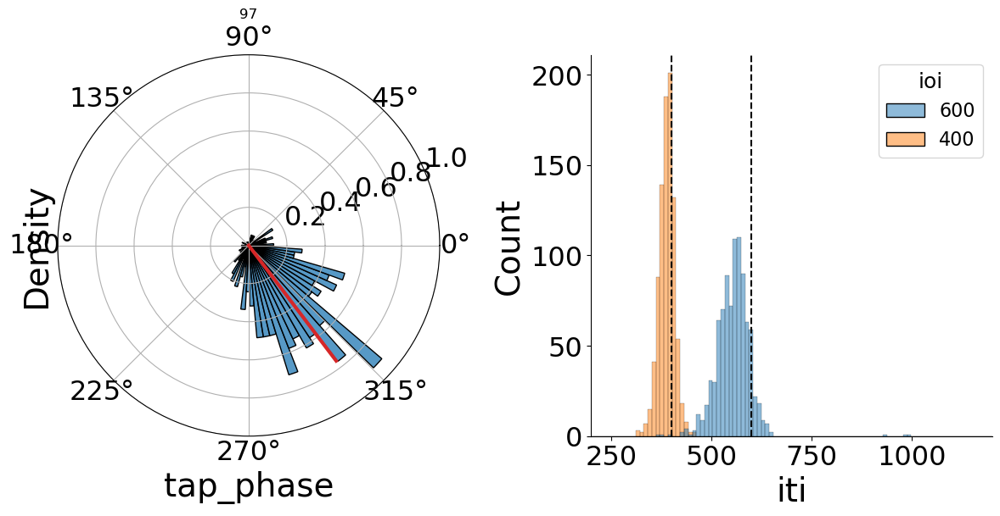

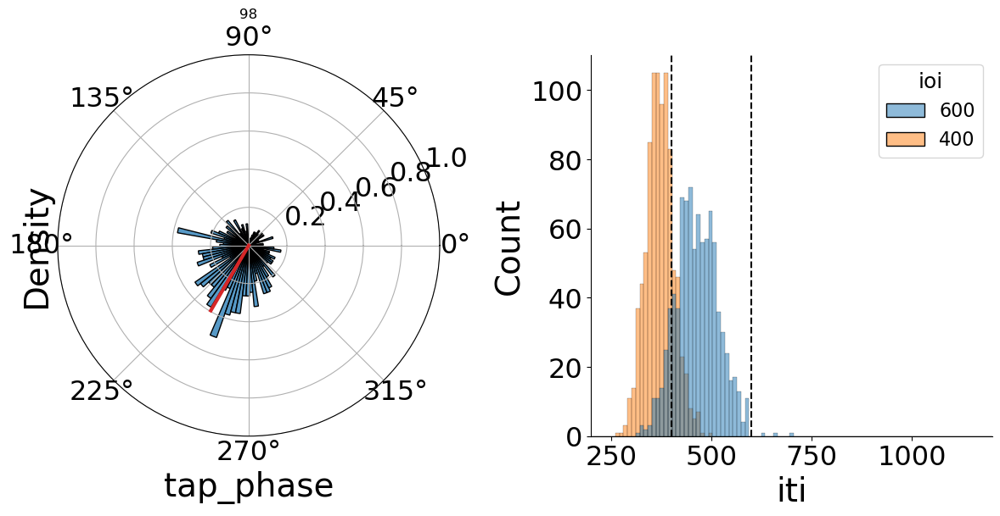

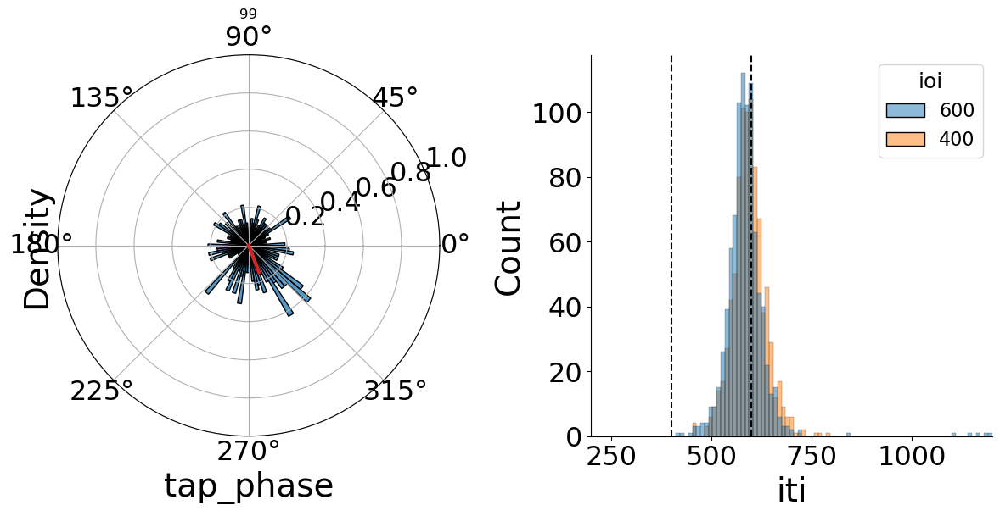

In [20]:
for i, subj in enumerate(sdata.subject.unique()):
    subj_sdata = sdata[sdata.subject == subj]
    subj_cdata = cdata[cdata.subject == subj]

    plt.Figure()
    plt.subplot(121, projection='polar')
    sns.histplot(data=subj_sdata, x='tap_phase', bins=np.linspace(0, 2*np.pi, 90), stat='density')
    plt.plot([mp[i], mp[i]], [0, mrl[i]], c='C3', lw=3, ls='-')
    plt.axhline(.2, c='k', ls='--')
    plt.title(subj)
    plt.ylim(0, 1)

    plt.subplot(122)
    sns.histplot(data=subj_cdata, x='iti', bins=np.linspace(200, 1200, 100), hue='ioi', hue_order=('600', '400'))
    plt.axvline(400, c='k', ls='--')
    plt.axvline(600, c='k', ls='--')
    plt.xlim(200, 1200)

    plt.gcf().set_size_inches(12, 6)
    plt.tight_layout()
    plt.show()